# WAVENET

In [ ]:
%pylab inline
%load_ext autoreload
%load_ext tensorboard
%autoreload
import IPython
from IPython.display import Audio
import tensorboard as tb
import os
# 数値演算
import numpy as np
import torch
from torch import nn
# 音声波形の読み込み
from scipy.io import wavfile
# 音声分析、可視化
import librosa
import librosa.display
import matplotlib.pyplot as plt

from pydub import AudioSegment

Populating the interactive namespace from numpy and matplotlib
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
# files                                                                       
src = "/Users/minami/Documents/python/lab/test/004.mp3"
dst = "test_004.wav"

# convert wav to mp3                                                            
audSeg = AudioSegment.from_mp3(src)
audSeg.export(dst, format="wav")

<_io.BufferedRandom name='test_004.wav'>

In [ ]:
def mulaw(x, mu=255):
    return np.sign(x) * np.log1p(mu * np.abs(x)) / np.log1p(mu)

def quantize(y, mu=255, offset=1):
    # [-1, 1] -> [0, 2] -> [0, 1] -> [0, mu]
    return ((y + offset) / 2 * mu).astype(np.int64)

def mulaw_quantize(x, mu=255):
    return quantize(mulaw(x, mu), mu)

def inv_mulaw(y, mu=255):
    return np.sign(y) * (1.0 / mu) * ((1.0 + mu)**np.abs(y) - 1.0)

def inv_quantize(y, mu):
    # [0, mu] -> [-1, 1]
    return 2 * y.astype(np.float32) / mu - 1

def inv_mulaw_quantize(y, mu=255):
    return inv_mulaw(inv_quantize(y, mu), mu)


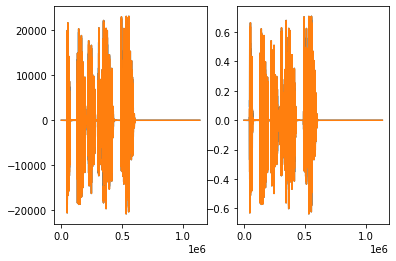

In [ ]:
file = "/Users/minami/Documents/python/lab/test/test_004.wav"
sr, x = wavfile.read(file)
x_comp = (x / 32768.0).astype(np.float32)
fig = plt.figure()
a1 = fig.add_subplot(1,2,1)
a1.plot(x)
a2 = fig.add_subplot(1,2,2)
a2.plot(x_comp)

In [ ]:
print(x.dtype)
print(x_comp.dtype)
print(x_comp.shape)
x_comp_t = x_comp.transpose()
print(x_comp_t.shape)
x_re = librosa.resample(x_comp_t, sr, 16000)

int16
float32
(1137024, 2)
(2, 1137024)


In [ ]:
rate = 48000
BPM = 120
qn_duration = 60.0/BPM
t = np.linspace(0., qn_duration, int(rate*qn_duration))
x = np.sin(2.0*np.pi*440.0*t)
Audio(x, rate=rate, )
# IPython.display.Audio(x, rate=rate, )

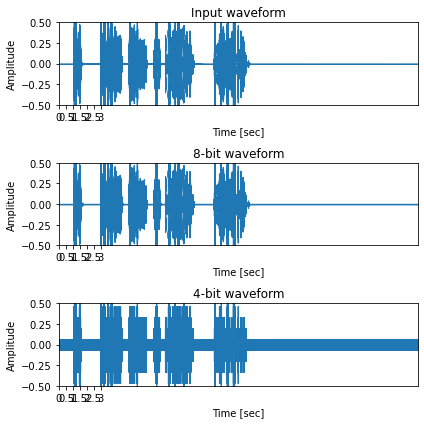

In [ ]:
file = "/Users/minami/Documents/python/lab/test/test_004.wav"
sr, x = wavfile.read(file)
x = (x / 32768.0).astype(np.float32)
x = librosa.resample(x.T, sr, 16000)
# x = x.T
sr = 16000

bits = [8, 4]

fig, ax = plt.subplots(len(bits)+1, 1, figsize=(6,2*(len(bits)+1)), sharey=True)
ax[0].set_title("Input waveform")
librosa.display.waveplot(x, sr, x_axis="time", ax=ax[0])
IPython.display.display(Audio(x, rate=sr))

for idx, bit in enumerate(bits):
    mu = 2**bit - 1
    x_hat = inv_quantize(quantize(x, mu), mu)
    librosa.display.waveplot(x_hat, sr, x_axis="time", ax=ax[idx+1])
    ax[idx+1].set_title(f"{bit}-bit waveform")
    IPython.display.display(Audio(x_hat, rate=sr))

for a in ax:
    a.set_xlabel("Time [sec]")
    a.set_ylabel("Amplitude")
    a.set_xticks(np.arange(0, 3.5, 0.5))
    a.set_ylim(-0.5, 0.5)
plt.tight_layout()

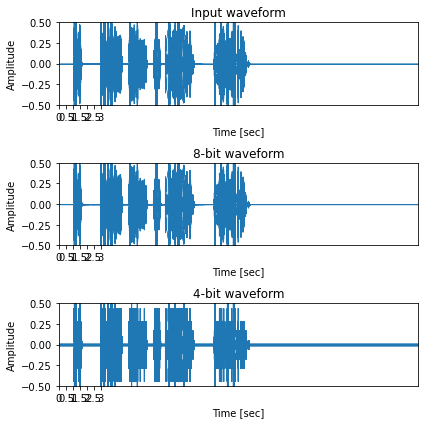

In [ ]:
sr, x = wavfile.read(file)
x = (x / 32768.0).astype(np.float32)
x = librosa.resample(x.T, sr, 16000)
sr = 16000

bits = [8, 4]

fig, ax = plt.subplots(len(bits)+1, 1, figsize=(6,2*(len(bits)+1)), sharey=True)
ax[0].set_title("Input waveform")
librosa.display.waveplot(x, sr, x_axis="time", ax=ax[0])
IPython.display.display(Audio(x, rate=sr))

for idx, bit in enumerate(bits):
    mu = 2**bit - 1
    x_hat = inv_mulaw_quantize(mulaw_quantize(x, mu), mu)
    librosa.display.waveplot(x_hat, sr, x_axis="time", ax=ax[idx+1])
    ax[idx+1].set_title(f"{bit}-bit waveform")
    IPython.display.display(Audio(x_hat, rate=sr))

for a in ax:
    a.set_xlabel("Time [sec]")
    a.set_ylabel("Amplitude")
    a.set_xticks(np.arange(0, 3.5, 0.5))
    a.set_ylim(-0.5, 0.5)
plt.tight_layout()

# 図7-7 (b)
# savefig("./fig/wavenet_inv_mulaw_waveform_b")


In [ ]:
def _toy_1d_input():
    # (B, C, T) where B and C = 1
    return torch.tensor([1,2,3,0,1,2,4],dtype=torch.float).view(1,1,-1)

In [ ]:
conv = nn.Conv1d(1,1,3,bias=False, padding=0)
conv.weight.data[0,0,:] = torch.tensor([1,2,6],dtype=torch.float)

x = _toy_1d_input()
with torch.no_grad():
    y= conv(x)
print("入力:", x.long().view(-1).tolist())
print("出力:", y.long().view(-1).tolist())

入力: [1, 2, 3, 0, 1, 2, 4]
出力: [23, 8, 9, 14, 29]


In [ ]:
x.shape

torch.Size([1, 1, 7])

In [ ]:
m = nn.Conv1d(16, 33, 3, stride=1)
m.weight.data[0,0,:] = torch.tensor([1,2,3], dtype=torch.float)
input = torch.randn(20, 16, 50)
output = m(input)

In [ ]:
output.shape

torch.Size([20, 33, 48])

In [ ]:
class CausalConv1d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, **kwargs):
        super().__init__()
        self.padding = (kernel_size - 1)
        self.conv = nn.Conv1d(in_channels, out_channels, kernel_size, padding=self.padding, **kwargs)

    def forward(self, x):
        # 1 次元畳み込み
        y = self.conv(x)
        print(y)
        # 因果性を担保するために、順方向にシフトする
        if self.padding > 0:
            y = y[:, :, :-self.padding]
        return y

class non_CausalConv1d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, **kwargs):
        super().__init__()
        self.padding = (kernel_size - 1)
        self.conv = nn.Conv1d(in_channels, out_channels, kernel_size, padding=self.padding, **kwargs)

    def forward(self, x):
        # 1 次元畳み込み
        y = self.conv(x)
        print(y)
        # 因果性を担保するために、順方向にシフトする
        # if self.padding > 0:
        #     y = y[:, :, :-self.padding]
        return y

In [ ]:
conv = CausalConv1d(1,1,3,bias=False)
conv_non = non_CausalConv1d(1,1,3,bias=False)

# テスト用に、畳み込みカーネルを手動で設定
conv.conv.weight.data[0,0,:] = torch.tensor([1,2,4],dtype=torch.float)
conv_non.conv.weight.data[0,0,:] = torch.tensor([1,2,4], dtype=torch.float)

x = _toy_1d_input()
# x = np.repeat(x, 3, axis=0)
print(x.shape)
y= conv(x)
y_non = conv_non(x)
print("入力:", x.long().view(-1).tolist())
print("出力:", y.long().view(-1).tolist())
print("出力:", y_non.long().view(-1).tolist())

torch.Size([1, 1, 7])
tensor([[[ 4., 10., 17.,  8.,  7., 10., 21., 10.,  4.]]],
       grad_fn=<ConvolutionBackward0>)
tensor([[[ 4., 10., 17.,  8.,  7., 10., 21., 10.,  4.]]],
       grad_fn=<ConvolutionBackward0>)
入力: [1, 2, 3, 0, 1, 2, 4]
出力: [4, 10, 17, 8, 7, 10, 21]
出力: [4, 10, 17, 8, 7, 10, 21, 10, 4]


In [ ]:
a = torch.randn(10,30,23)
print(a.shape)
a = a.view(-1)
print(a.shape)
print(a)
print(a.long())
print(a.dtype)
print(a.long().dtype)

torch.Size([10, 30, 23])
torch.Size([6900])
tensor([ 1.7723,  0.1609,  1.1332,  ...,  0.8579, -0.2920,  0.0068])
tensor([1, 0, 1,  ..., 0, 0, 0])
torch.float32
torch.int64


In [ ]:
x = torch.randn(10).reshape(1,1,-1)
print(x)
x_shift = x[:, :, :-2]
print(x_shift)
x = x_shift
print(x)

tensor([[[ 0.4763, -0.8496, -0.8167,  1.7715,  0.0452,  0.3597, -1.9212,
           2.2617,  0.6010, -0.4741]]])
tensor([[[ 0.4763, -0.8496, -0.8167,  1.7715,  0.0452,  0.3597, -1.9212,
           2.2617]]])
tensor([[[ 0.4763, -0.8496, -0.8167,  1.7715,  0.0452,  0.3597, -1.9212,
           2.2617]]])


In [ ]:
input = np.random.randn(20, 16, 50)
print(input.dtype)

float64


In [ ]:
conv = CausalConv1d(16, 33, 3)
input = np.random.randn(20, 16, 50)
input = input.astype(np.float32)
input = torch.from_numpy(input).clone()
input2 = torch.randn(33, 16, 3)
x = _toy_1d_input()
y = conv(input2)

In [ ]:
class DilatedCausalConv1d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, dilation=1, **kwargs):
        super().__init__()
        # パディングの幅を計算する際に、 dilation factor を考慮する必要があることに注意
        self.padding = (kernel_size - 1) * dilation
        self.conv = nn.Conv1d(in_channels, out_channels, kernel_size, padding=self.padding, dilation=dilation, **kwargs)

    def forward(self, x):
        # 1 次元畳み込み
        y = self.conv(x)
        # 因果性を担保するために、順方向にシフトする
        if self.padding > 0:
            y = y[:, :, :-self.padding]
        return y

In [ ]:
x = torch.tensor([[1, 2, 3],[1, 2, 3],[1, 2, 3]]).view(1,3,-1).float()
y = nn.Upsample(scale_factor=3, mode="nearest")(x)
print(x)
print(y)

tensor([[[1., 2., 3.],
         [1., 2., 3.],
         [1., 2., 3.]]])
tensor([[[1., 1., 1., 2., 2., 2., 3., 3., 3.],
         [1., 1., 1., 2., 2., 2., 3., 3., 3.],
         [1., 1., 1., 2., 2., 2., 3., 3., 3.]]])


In [ ]:
a = torch.arange(1, 10, 0.1).view(1, 5, 2, -1)
print(a.shape)
test = nn.Upsample(scale_factor=10, mode='nearest')
a_up = test(a)
print(a_up.shape)

torch.Size([1, 5, 2, 9])
torch.Size([1, 5, 20, 90])


In [ ]:
class RepeatUpsampling(nn.Module):
    def __init__(self, upsample_scales):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=np.prod(upsample_scales), mode="nearest")

    def forward(self, c):
        return self.upsample(c)

In [ ]:
c = torch.ones(32, 80, 10)
# 例として、100倍にアップサンプリング
c_up = RepeatUpsampling([100])(c)

print("入力のサイズ：", tuple(c.shape))
print("出力サイズ：", tuple(c_up.shape))

入力のサイズ： (32, 80, 10)
出力サイズ： (32, 80, 1000)


In [ ]:
from torch.nn import functional as F

class UpsampleNetwork(nn.Module):
    def __init__(self, upsample_scales):
        super().__init__()
        self.upsample_scales = upsample_scales
        self.conv_layers = nn.ModuleList()
        for scale in upsample_scales:
            kernel_size = (1, scale * 2 + 1)
            conv = nn.Conv2d(
                1, 1, kernel_size=kernel_size, padding=(0, scale), bias=False
            )
            conv.weight.data.fill_(1.0 / np.prod(kernel_size))
            self.conv_layers.append(conv)

    def forward(self, c):
        # (B, 1, C, T)
        c = c.unsqueeze(1)
        # 最近傍補完と畳み込みの繰り返し
        for idx, scale in enumerate(self.upsample_scales):
            # 時間方向にのみアップサンプリング
            # (B, 1, C, T) -> (B, 1, C, T*scale)
            c = F.interpolate(c, scale_factor=(1, scale), mode="nearest")
            c = self.conv_layers[idx](c)
        # B x C x T
        return c.squeeze(1)

In [ ]:
c = torch.ones(32, 80, 10)
c_up = UpsampleNetwork([10, 8])(c)

print("入力のサイズ：", tuple(c.shape))
print("出力サイズ：", tuple(c_up.shape))

入力のサイズ： (32, 80, 10)
出力サイズ： (32, 80, 800)


In [ ]:
# 初期化の影響を確認するため、畳み込みのパラメータを乱数で初期化
class RandomInitUpsampleNetwork(UpsampleNetwork):
    def __init__(self, upsample_scales):
        super().__init__(upsample_scales)
        for conv in self.conv_layers:
            nn.init.normal_(conv.weight.data, 0, 1.0)

In [ ]:
def Conv1d1x1(in_channels, out_channels, bias=True):
    return nn.Conv1d(
        in_channels, out_channels, kernel_size=1, padding=0, dilation=1, bias=bias
    )

In [ ]:
def Conv1d1by1(in_channels, out_channels, bias=True):
    return nn.Conv1d(
        in_channels, out_channels, kernel_size=1, padding=0, dilation=1, bias=bias
    )

In [ ]:
class ResSkipBlock(nn.Module):
    def __init__(
        self,
        residual_channels,  # 残差結合のチャネル数
        gate_channels,  # ゲートのチャネル数
        kernel_size,  # カーネルサイズ
        skip_out_channels,  # スキップ結合のチャネル数
        dilation=1,  # dilation factor
        cin_channels=80,  # 条件付特徴量のチャネル数
        *args,
        **kwargs,
    ):
        super().__init__()
        self.padding = (kernel_size - 1) * dilation

        # 1 次元膨張畳み込み (dilation == 1 のときは、通常の 1 次元畳み込み)
        self.conv = nn.Conv1d(
            residual_channels,
            gate_channels,
            kernel_size,
            padding=self.padding,
            dilation=dilation,
            *args,
            **kwargs,
        )

        # local conditioning 用の 1x1 convolution
        self.conv1x1c = Conv1d1x1(cin_channels, gate_channels, bias=False)

        # ゲート付き活性化関数のために、1 次元畳み込みの出力は 2 分割されることに注意
        gate_out_channels = gate_channels // 2
        self.conv1x1_out = Conv1d1x1(gate_out_channels, residual_channels)
        self.conv1x1_skip = Conv1d1x1(gate_out_channels, skip_out_channels)

    def forward(self, x, c):
        # 残差接続用に入力を保持
        residual = x

        # 1 次元畳み込み
        splitdim = 1  # (B, C, T)
        x = self.conv(x)
        # 因果性を保証するために、出力をシフトする
        x = x[:, :, : -self.padding]

        # チャネル方向で出力を分割
        a, b = x.split(x.size(1) // 2, dim=1)

        # local conditioning
        c = self.conv1x1c(c)
        ca, cb = c.split(c.size(1) // 2, dim=1)
        a, b = a + ca, b + cb

        # ゲート付き活性化関数
        x = torch.tanh(a) * torch.sigmoid(b)

        # スキップ接続用の出力を計算
        s = self.conv1x1_skip(x)

        # 残差接続の要素和を行う前に、次元数を合わせる
        x = self.conv1x1_out(x)

        x = x + residual

        return x, s

In [ ]:
class ResSkipBlock(nn.Module):
    def __init__(
        self,
        residual_channels,
        gate_channels,
        kernel_size,
        skip_out_channels,
        dilation=1,
        cin_channels=80,
        *args,
        **kwargs,
    ):
        super().__init__()
        self.padding = (kernel_size - 1) * dilation

        self.conv = nn.Conv1d(
            residual_channels,
            gate_channels,
            kernel_size,
            padding=self.padding,
            dilation=dilation,
            *args,
            **kwargs,
        )

        self.conv1x1c = Conv1d1x1(cin_channels, gate_channels, bias=False)

        gate_out_channels = gate_channels // 2
        self.conv1x1_out = Conv1d1x1(gate_out_channels, residual_channels)
        self.conv1x1_skip = Conv1d1x1(gate_out_channels, skip_out_channels)

    def forward(self, x, c):
        residual = x

        splitdim = 1
        x = self.conv(x)
        x = x[:, :, :-self.padding]

        a, b = x.split(x.size(1) // 2, dim=1)

        c = self.conv1x1c(c)
        ca, cb = c.split(c.size(1) // 2, dim=1)
        a, b = a + ca, b + cb

        x = torch.tanh(a) * torch.sigmoid(b)

        s = self.conv1x1_skip(x)

        x = self.conv1x1_out(x)

        x = x + residual

        return x, s


In [ ]:
x = torch.arange(-10, 10, 0.1).view(1, 10, -1).float()
print(x.shape)
print(x.size(1))
a, b = x.split(x.size(1) // 2, dim=1)
print(f"a = \n{a.shape}\nb = \n{b.shape}\n")

torch.Size([1, 10, 20])
10
a = 
torch.Size([1, 5, 20])
b = 
torch.Size([1, 5, 20])



In [ ]:
kernel_size = 3
conv = ResSkipBlock(128, 16, kernel_size, 64, dilation=4)
x = torch.ones(32, 128, 100)
c = torch.ones(32, 80, 100)
out, skip = conv(x, c)
out.shape, skip.shape

(torch.Size([32, 128, 100]), torch.Size([32, 64, 100]))

In [ ]:
class WaveNet(nn.Module):
    def __init__(
        self,
        out_channels=256,  # 出力のチャネル数
        layers=30,  # レイヤー数
        stacks=3,  # 畳み込みブロックの数
        residual_channels=64,  # 残差結合のチャネル数
        gate_channels=128,  # ゲートのチャネル数
        skip_out_channels=64,  # スキップ接続のチャネル数
        kernel_size=2,  # 1 次元畳み込みのカーネルサイズ
        cin_channels=80,  # 条件付け特徴量のチャネル数
        upsample_scales=None,  # アップサンプリングのスケール
        aux_context_window=0,  # アップサンプリング時に参照する近傍フレーム数
    ):
        super().__init__()
        self.out_channels = out_channels
        self.cin_channels = cin_channels
        self.aux_context_window = aux_context_window
        if upsample_scales is None:
            upsample_scales = [10, 8]
        self.upsample_scales = upsample_scales

        self.first_conv = Conv1d1x1(out_channels, residual_channels)

        # メインとなる畳み込み層
        self.main_conv_layers = nn.ModuleList()
        layers_per_stack = layers // stacks
        for layer in range(layers):
            dilation = 2 ** (layer % layers_per_stack)
            conv = ResSkipBlock(
                residual_channels,
                gate_channels,
                kernel_size,
                skip_out_channels,
                dilation=dilation,
                cin_channels=cin_channels,
            )
            self.main_conv_layers.append(conv)

            # スキップ接続の和から波形への変換
        self.last_conv_layers = nn.ModuleList(
            [
                nn.ReLU(),
                Conv1d1x1(skip_out_channels, skip_out_channels),
                nn.ReLU(),
                Conv1d1x1(skip_out_channels, out_channels),
            ]
        )

        # フレーム単位の特徴量をサンプル単位にアップサンプリング
        self.upsample_net = ConvInUpsampleNetwork(
            upsample_scales, cin_channels, aux_context_window
        )

    def forward(self, x, c):
        # 量子化された離散値列から One-hot ベクトルに変換
        # (B, T) -> (B, T, out_channels) -> (B, out_channels, T)
        x = F.one_hot(x, self.out_channels).transpose(1, 2).float()

        # 条件付け特徴量のアップサンプリング
        c = self.upsample_net(c)

        # One-hot ベクトルの次元から隠れ層の次元に変換
        x = self.first_conv(x)

        # メインの畳み込み層の処理
        # 各層におけるスキップ接続の出力を加算して保持
        skips = 0
        for f in self.main_conv_layers:
            x, h = f(x, c)
            skips += h

        # スキップ接続の和を入力として、出力を計算
        x = skips
        for f in self.last_conv_layers:
            x = f(x)

        # NOTE: 出力を確率値として解釈する場合には softmax が必要ですが、
        # 学習時には nn.CrossEntropyLoss の計算に置いて softmax の計算が行われるので、
        # ここでは明示的に softmax を計算する必要はありません
        return x

In [ ]:
x = torch.arange(0, 10).view(2,-1)
print(x.shape)
x_hot = nn.functional.one_hot(x % 10, num_classes=15)
print(x_hot)    

torch.Size([2, 5])
tensor([[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]],

        [[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0]]])


In [ ]:
from torch.nn import functional as F

F.one_hot(torch.arange(0, 5))

tensor([[1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1]])

In [ ]:
torch.arange(0, 5) % 3

tensor([0, 1, 2, 0, 1])